In [1]:
# Load packages
from datetime import datetime
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import scipy
import sys

from scipy.stats import chisquare
from sklearn.model_selection import KFold, cross_val_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.sandbox.stats.multicomp
from statsmodels.genmod.families import family, links

# Set up logging
from analytics.util.analytics_logger import GetAnalyticsLogger
import logging
logger = GetAnalyticsLogger()
logger.setLevel(logging.INFO)
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger('analytics')
logger.setLevel(logging.INFO)

# Snapshots
from arivale_data_interface import *

# set Seed
np.random.seed(123)

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-piayybp_ because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
# declare universal variables
SUFFIX = ' (protein)'

In [3]:
def add_suffix_to_column_names(df, suffix):
    new_columns = {}
    for column in df.columns:
        if column != 'Patient-ID':
            new_column = column + suffix
        else:
            new_column = column
        new_columns[column] = new_column
    df.rename(columns=new_columns, inplace=True)
    return df


def calc_chi_square(dict_obs, dict_exp):
    list_obs, list_exp = [], []
    total_obs = sum(dict_obs.values())
    total_exp = sum(dict_exp.values())
    for key in dict_obs.keys():
        list_obs.append(dict_obs[key])
        list_exp.append(dict_exp[key])
    chi_test = chisquare(f_obs=list_obs, f_exp=list_exp)
    print(chi_test)
    
def create_binary_dict(df, col):
    d = {}
    d['No'] = len(df[df[col] == 0])
    d['Yes'] = len(df[df[col] == 1])
    return d

In [4]:
dfpb = pd.read_table('data/proteins-final.csv', sep=',', dtype={'Patient-ID':str})
dfpb = add_suffix_to_column_names(dfpb, SUFFIX)
dfmb = pd.read_table('data/metabolites-final.csv', sep=',', dtype={'Patient-ID':str})
dfmb.replace(0, np.nan, inplace=True)
dfmirna = pd.read_table('data/mirna-final.csv', sep=',', dtype={'Patient-ID':str})
dfmirna.replace(0, np.nan, inplace=True)
dftb = pd.read_table('data/transcripts-final.csv', sep=',', dtype={'Patient-ID':str})
dftb.replace(0, np.nan, inplace=True)

dfp_analyte = pd.read_table('data/protein-meta-final.csv', sep=',')
dfm_analyte = pd.read_table('data/metabolites-meta-final.csv', sep=',')
dfmirna_analyte = pd.read_table('data/mirna-meta-final.csv', sep=',')
dft_analyte = pd.read_table('data/transcripts-meta-final.csv', sep=',')

df_clinical = pd.read_table('data/metadata-final.csv', sep=',', dtype={'Patient-ID':str})
df_clinical = df_clinical[df_clinical['Condition']!='Control PTD']
df_clinical = df_clinical[df_clinical['InfSex']>=0]  # limit to those cases in which the fetal sex is known

In [5]:
dfmb.shape, dfmirna.shape, dfpb.shape, dftb.shape, df_clinical.shape

((341, 1033), (318, 2416), (343, 461), (318, 52084), (328, 24))

# Set up annotations

In [6]:
metam = get_snapshot('metabolomics_metadata')
metam['CHEMICAL_ID'] = metam['CHEMICAL_ID'].astype(str)
metap = get_snapshot('proteomics_metadata')

metabolites = {}
for index, row in dfm_analyte.iterrows():
    metabolites[row['CHEMICAL_NAME']] = {'name': row['CHEMICAL_NAME'], 'sub_group': row['SUB_PATHWAY'], 'super_group': row['SUPER_PATHWAY']}
proteins = {}
for index, row in dfp_analyte.iterrows():
    proteins[row['Assay'] + SUFFIX] = {'name': row['Assay'], 'sub_group': None, 'super_group': row['Panel']}
miRNAs = {}
for index, row in dfmirna_analyte.iterrows():
    miRNAs[row['Transcript']] = {'name': row['Transcript'], 'sub_group': None, 'super_group': None}
transcripts = {}
for index, row in dft_analyte.iterrows():
    transcripts[row['Transcript']] = {'name': row['Transcript'], 'sub_group': None, 'super_group': None}
    
# print the number of included analytes
print('Metabolites:', str(len(metabolites)))
print('MiRNAs:', str(len(miRNAs)))
print('Proteins:', str(len(proteins)))
print('Transcripts:', str(len(transcripts)))
print('Total:', str(len(metabolites)+len(proteins)+len(transcripts)))

/shared-libs/arivale-data-interface/pylib/arivale_data_interface/snapshots_interface.py:122: FutureWarning: The default value of regex will change from True to False in a future version.
  t = pandas.to_datetime(x.str.replace("^arivale_snapshot.*(\\d{4}-\\d{2}-\\d{2}_\\d{4})$", "\\1"), format="%Y-%m-%d_%H%M")
/shared-libs/arivale-data-interface/pylib/arivale_data_interface/snapshots_interface.py:227: FutureWarning: The default value of regex will change from True to False in a future version.
  colnames = hdr.loc[~hdr.str.contains("^#")].head(1).str.replace("\n$","")
/shared-libs/arivale-data-interface/pylib/arivale_data_interface/snapshots_interface.py:232: FutureWarning: The default value of regex will change from True to False in a future version.
  hdr = hdr.loc[hdr.str.contains("^#")].str.replace("\n$","")
/shared-libs/arivale-data-interface/pylib/arivale_data_interface/snapshots_interface.py:174: FutureWarning: The default value of regex will change from True to False in a future

Metabolites: 1032
MiRNAs: 2414
Proteins: 452
Transcripts: 51174
Total: 52658


In [7]:
# Drop missingness and non-varying values
thresh_missingness = 0.8
thresh_unique = 0.5
thresh_mirna_read_counts = 10
thresh_rna_read_counts = 500

minNonNA = dfmb.shape[0] * thresh_missingness
dfmb.dropna(thresh=minNonNA, axis=1, inplace=True)
minUnique = dfmb.nunique()/len(dfmb)
col_drop = minUnique[minUnique < thresh_unique].index
dfmb.drop(columns=col_drop, inplace=True)

minNonNA = dfmirna.shape[0] * thresh_missingness
dfmirna.dropna(thresh=minNonNA, axis=1, inplace=True)
minUnique = dfmirna.nunique()/len(dfmirna)
col_drop = minUnique[minUnique < thresh_unique].index
dfmirna.drop(columns=col_drop, inplace=True)
col_sums = dfmirna.sum()
col_sums.drop(col_sums.index[1], inplace=True)
col_drop = col_sums[col_sums < thresh_mirna_read_counts].index
dfmirna.drop(columns=col_drop, inplace=True)

minNonNA = dfpb.shape[0] * thresh_missingness
dfpb.dropna(thresh=minNonNA, axis=1, inplace=True)
minUnique = dfpb.nunique()/len(dfpb)
col_drop = minUnique[minUnique < thresh_unique].index
dfpb.drop(columns=col_drop, inplace=True)

minNonNA = dftb.shape[0] * thresh_missingness
dftb.dropna(thresh=minNonNA, axis=1, inplace=True)
minUnique = dftb.nunique()/len(dftb)
col_drop = minUnique[minUnique < thresh_unique].index
dftb.drop(columns=col_drop, inplace=True)
col_sums = dftb.sum()
col_sums.drop(col_sums.index[1], inplace=True)
col_drop = col_sums[col_sums < thresh_rna_read_counts].index
dftb.drop(columns=col_drop, inplace=True)

dfm_analyte = list(set(metabolites.keys()).intersection(dfmb.columns))
dfmirna_analyte = list(set(miRNAs.keys()).intersection(dfmirna.columns))
dfp_analyte = list(set(proteins.keys()).intersection(dfpb.columns))
dft_analyte = list(set(transcripts.keys()).intersection(dftb.columns))

# Get all analytes together
analytes = dfm_analyte + dfmirna_analyte + dfp_analyte + dft_analyte

# print the number of included analytes that pass missingness threshold
print('# Metabolites:', str(len(dfm_analyte)))
print('# MiRNAs:', str(len(dfmirna_analyte)))
print('# Proteins:', str(len(dfp_analyte)))
print('# Transcripts:', str(len(dft_analyte)))
print('# Total:', str(len(analytes)))


# without 50% uniqueness threshold
# Metabolites: 865
# MiRNAs: 826
# Proteins: 343
# Transcripts: 23810
# Total: 25844

# with at least 25% uniqueness threshold
# Metabolites: 865
# MiRNAs: 619
# Proteins: 343
# Transcripts: 13424
# Total: 15251

# with at least 50% uniqueness threshold
# Metabolites: 865
# MiRNAs: 448
# Proteins: 343
# Transcripts: 9582
# Total: 11238

# Metabolites: 865
# MiRNAs: 448
# Proteins: 343
# Transcripts: 9582
# Total: 11238


In [8]:
df_clinical.head()

,Patient-ID,Condition,LaborInitiation,MaternalAge,isAsian,isBlack,isNativeAmerican,isPacificIslander,isWhite,RaceMissing,...,Para,LaborOnset,Smoker,IllicitDrugUser,DeliveryMethod,PregnancyRelatedHypertension,FetalGrowthRestriction,Preeclampsia,InfSex,Birthweight
0,KH-1100,PTD,1,42.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0,0,0,0.0,2250.0
1,KH-1103,PTD,1,32.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0,0,0,1.0,3060.0
2,KH-1132,Severe PE,0,31.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1,0,1,1.0,3490.0
3,KH-1149,Severe PE,0,29.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,1.0,0.0,1,0,1,0.0,1545.0
4,MJ-0006,FGR,0,32.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0,1,0,1.0,2295.0


In [9]:
df = df_clinical.merge(dfpb[['Patient-ID'] + list(dfp_analyte)], on=['Patient-ID'], how='inner')
df = df.merge(dfmb[['Patient-ID'] + list(dfm_analyte)], on=['Patient-ID'], how='left')
df = df.merge(dfmirna[['Patient-ID'] + list(dfmirna_analyte)], on=['Patient-ID'], how='left')
df = df.merge(dftb[['Patient-ID'] + list(dft_analyte)], on=['Patient-ID'], how='left')
df = df.fillna(-1)

df['PregravidBMISquared'] = df['PregravidBMI'] ** 2

In [10]:
df.shape

(321, 11263)

# Train Models

In [11]:
DROP_COLS = [
            'Patient-ID', 'Grav', 'DeliveryMethod', 
            'Para', 'Ethnicity', 'isAsian', 
            'isBlack', 'Condition', 'isWhite',
            'InfSex', 'Birthweight', 'LaborOnset',
            'MaternalAge', 'PregravidBMI'
             ]

In [12]:
def detect_outliers(data):
    
    # if no data is passed return False
    if len(data) == 0:
        False
        
    # Calculate z-scores
    z_scores = scipy.stats.zscore(data)
    
    # Define a z-score threshold for outliers (e.g., |z-score| > 3)
    threshold = 3
    
    # Identify extreme outliers
    extreme_outliers = data[abs(z_scores) > threshold]
    
    # if extreme outliers compose more than 2.5% of the data then mark it as extreme outliers present
    if len(extreme_outliers)/len(data) > 0.025:
        return True
    
    return False


def log_sig_analytes(df, feature):
    logger.info('Analytes that are significantly regulated by {}'.format(feature))
    for analyte in df['Analyte']:
        logger.info('{}'.format(analyte))
    logger.info('\n')


def run_glm(dat, analytes, max_run=None):
    
    fhandler = logging.FileHandler(filename='output/glm.single.random.all.miniDP3.log', mode='a')
    logger.addHandler(fhandler)
         
    count = 0 
    done = 0
    skipped = 0
    completed = 0

    results = []
    results_sig = []
    columns = list(dat.columns)

    start_time = datetime.now()
    
    for analyte in analytes:
        
        # Default is gaussian- only switch to gamma if the analyte levels follow a non-normal distribution
        family_type = family.Gaussian()
        #family_type = family.Gaussian(link=sm.families.links.log())
        family_type.link = links.identity()
        family_name = 'Gaussian'
        #family_name = 'Log Normal Distribution'
        family_link = 'Identity'
        
        sub = dat[['Patient-ID', analyte, 'WksGest', 'PregravidBMISquared', 'LaborInitiation', 'Smoker', 'IllicitDrugUser']].copy()
        sub.rename(columns={analyte:'Analyte'}, inplace=True)
        sub['Analyte'] = sub['Analyte'].astype(np.float64)
        
        # log transfrom data
        # sub['Analyte'] = np.log(sub['Analyte'])
        
        # evaluate if there are extreme values
        extreme_outliers = detect_outliers(sub['Analyte'])
        
        # evaluate data normality using an anderson darling test
        ks_statistic, ks_p_value = scipy.stats.kstest(sub['Analyte'], 'norm')
        
        # if data is skewed or fails a normality test (with Bonferonni multiple hypothesis correction), then use the gamma family
        if abs(sub['Analyte'].skew()) > 1.5 or ks_p_value < 0.05:

            # Set any zero values to 1/2 the smallest value
            sub.loc[sub['Analyte']==0, analyte] = (sub.loc[sub['Analyte']>0, 'Analyte'].min() / 2.0)

            family_type = family.Gamma()
            family_type.link = links.log()
            family_name = 'Gamma'
            family_link = 'Log'

        try:
            ols_model = 'Analyte ~ WksGest + PregravidBMISquared + C(LaborInitiation) + C(Smoker) + C(IllicitDrugUser)'
            model = smf.glm(ols_model, data=sub, family=family_type, missing='drop')
            if extreme_outliers:
                # Fit the robust GLM model with robust Huber estimation
                fitted_model = model.fit(cov_type='hc0', maxiter=100)
            else:
                fitted_model = model.fit(maxiter=100)

            # Calculate the pseudo R-squared
            null_deviance = fitted_model.null_deviance
            residual_deviance = fitted_model.deviance
            pseudo_r_squared = 1 - (residual_deviance / null_deviance)
            
            # write to results
            results.append((analyte, len(fitted_model.fittedvalues), family_name, family_link, extreme_outliers, ks_statistic, ks_p_value, fitted_model.converged, *fitted_model.params, *fitted_model.pvalues, pseudo_r_squared))
            completed += 1

        except Exception as e:
            logger.info('Failed analytes {} with error {}'.format(analyte, str(e)))
                  
        count += 1
        if (max_run is not None) and (count >= max_run):
            break

        if (count % 100) == 0:
            elapsed_time = datetime.now() - start_time    
            logger.info('Finished {} in {:.3f} seconds (skipped {})'.format(count, elapsed_time.total_seconds(), skipped))
    
    df = pd.DataFrame(results, columns=['Analyte', 'N', 'Model Family', 'Link Function', 'Extreme Outliers', 'K-S Statistic', 'K-S p-value', 'Converged', *fitted_model.params.index, *[str(x)+'_p' for x in fitted_model.pvalues.index], 'Pseudo_R_Squared'])
    df.sort_values(['WksGest_p'], ascending=True, inplace=True)

    np.seterr(all='warn')
    logger.info('\nNumber of analytes analyzed: {}'.format(str(count)))
    logger.info('Number of analytes with converged formula: {}'.format(str(df.shape[0])))
    (adj_pval_index, adj_pval, _, _) = statsmodels.sandbox.stats.multicomp.multipletests(df.loc[~df['WksGest_p'].isnull(), 'WksGest_p'], alpha=0.05, method='fdr_bh')
    df.loc[~df['WksGest_p'].isnull(), 'pval_adj'] = adj_pval
    df.sort_values(['pval_adj'], ascending=True, inplace=True)
    
    # filter for significance
    df = df[df['pval_adj']<0.05] #benjammini-hochman
    logger.info('Number of analytes whose levels are significantly regulated by gestational weeks as a function of pregravid bmi, labor initiation, smoking status, and illicit drug use status: {}'.format(str(df.shape[0])))
    #bonferroni_correction = 0.05/count
    
    fhandler.close()
    
    return df


def calc_distribution_of_sig_between_groups(glm_group_1, glm_group_2):
    list_sig_group_1_only = []
    list_sig_group_2_only = []
    list_sig_both = []

    for item in glm_group_1['Analyte']:
        if item in list(glm_group_2['Analyte']):
            list_sig_both.append(item)
        else:
            list_sig_group_1_only.append(item)

    for item in glm_group_2['Analyte']:
        if item not in list_sig_both:
            list_sig_group_2_only.append(item)
            
    
    n_group_1_only = len(list_sig_group_1_only)
    n_group_2_only = len(list_sig_group_2_only)
    n_both_groups = len(list_sig_both)

    return n_group_1_only, n_group_2_only, n_both_groups


def get_random_distribution(df):
    list_group_1 = []
    list_group_2 = []
    list_group_1_only = []
    list_group_2_only = []
    list_both_groups = []
    count = 0
    
    while count < 100:
        # randomly permute fetal sex label to create two randomly generated groups
        df['InfSex'] = np.random.permutation(df.InfSex)
        df_group_1 = df[df['InfSex']==0]
        df_group_2 = df[df['InfSex']==1]
        # train GLMs for each group
        glm_group_1 = run_glm(df_group_1, analytes)
        list_group_1.append(len(glm_group_1['Analyte']))
        glm_group_2 = run_glm(df_group_1, analytes)
        list_group_2.append(len(glm_group_2['Analyte']))
        # calculate the number of significant analytes unique to each random group and overlapping
        n_group_1_only, n_group_2_only, n_both_groups = calc_distribution_of_sig_between_groups(glm_group_1, glm_group_2)
        list_group_1_only.append(n_group_1_only)
        list_group_2_only.append(n_group_2_only)
        list_both_groups.append(n_both_groups)
        count+=1
        print('\n\n\n')
        print('Finished random iteration:', str(count))
        print('\n\n\n')
    return list_group_1, list_group_2, list_group_1_only, list_group_2_only, list_both_groups

In [ ]:
list_group_1, list_group_2, list_group_1_only, list_group_2_only, list_both_groups = get_random_distribution(df)

/opt/conda/envs/arivale-py3/lib/python3.7/site-packages/statsmodels/genmod/generalized_linear_model.py:1132: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  start_params = np.zeros(self.exog.shape[1], np.float)
/opt/conda/envs/arivale-py3/lib/python3.7/site-packages/statsmodels/genmod/families/links.py:517: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/opt/conda/envs/arivale-py3/lib/python3.7/site-packages/statsmodels/genmod/families/family.py:697: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/opt/conda/envs/arivale-py3/lib/python3.7/site-packages/statsmodels/genmod/families/family.py:698: Runtime





Finished random iteration: 1






2024-06-21 06:18:26,892 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:18:27,189 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:18:27,264 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:18:27,373 INFO Failed analytes creatine phosphate with error NaN, inf or invalid value detected in





Finished random iteration: 2






2024-06-21 06:33:08,001 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:33:08,068 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:33:08,477 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:33:08,547 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyel





Finished random iteration: 3






2024-06-21 06:47:04,983 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:47:05,096 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:47:05,284 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 06:47:05,750 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error 





Finished random iteration: 4






2024-06-21 07:01:09,075 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:01:09,197 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:01:09,233 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:01:09,316 INFO Failed analytes sucrose with error NaN, inf or invalid value detected i





Finished random iteration: 5






2024-06-21 07:15:41,783 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:15:42,437 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:15:42,504 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:15:42,787 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, i





Finished random iteration: 6






2024-06-21 07:30:25,327 INFO Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:30:25,361 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:30:25,393 INFO Failed analytes isobutyrylcarnitine (C4) with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes isobutyrylcarnitine (C4) with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:30:25,716 INFO Failed analytes sphingomyelin (d18:2/21:0, d16:2/23:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.






Finished random iteration: 7






2024-06-21 07:45:11,587 INFO Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:45:11,619 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:45:11,830 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:45:11,862 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with 





Finished random iteration: 8






2024-06-21 07:59:48,946 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:59:49,791 INFO Failed analytes pyridoxal with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes pyridoxal with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:59:49,904 INFO Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 07:59:50,223 INFO Failed analytes N-arachidonoyltaurine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-arachidonoyltaurine wit





Finished random iteration: 9






2024-06-21 08:14:03,962 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:14:04,066 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:14:04,251 INFO Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:14:04,376 INFO Failed analytes 2-hydroxynervonate* with error NaN, inf or invalid value detected in weights, estimation infeas





Finished random iteration: 10






2024-06-21 08:30:12,083 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:30:12,239 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:30:12,272 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:30:12,304 INFO Failed analytes mannonate* with error NaN, inf or invalid value detecte





Finished random iteration: 11






2024-06-21 08:44:30,274 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:44:30,328 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:44:30,516 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 08:44:30,697 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.






Finished random iteration: 12






2024-06-21 09:00:04,138 INFO Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:00:04,456 INFO Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:00:04,484 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:00:04,926 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-





Finished random iteration: 13






2024-06-21 09:14:08,341 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:14:08,447 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:14:08,512 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:14:08,627 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed an





Finished random iteration: 14






2024-06-21 09:28:25,941 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:28:26,179 INFO Failed analytes 2-hydroxyarachidate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 2-hydroxyarachidate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:28:26,790 INFO Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:28:27,101 INFO Failed analytes N-arachidonoyltaurine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-a





Finished random iteration: 15






2024-06-21 09:43:13,038 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:43:13,072 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:43:13,239 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:43:13,373 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.






Finished random iteration: 16






2024-06-21 09:57:53,924 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:57:54,109 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:57:54,281 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 09:57:54,708 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with er





Finished random iteration: 17






2024-06-21 10:12:35,694 INFO Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:12:36,224 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:12:36,296 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:12:37,006 INFO Failed analytes pyridoxal with error NaN, inf or invalid value detected in weights, estimat





Finished random iteration: 18






2024-06-21 10:26:55,572 INFO Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:26:56,181 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:26:56,500 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:26:56,865 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation 





Finished random iteration: 19






2024-06-21 10:41:20,088 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:41:20,266 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:41:20,312 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:41:20,852 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:an





Finished random iteration: 20






2024-06-21 10:55:50,605 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:55:51,183 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:55:51,257 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 10:55:51,655 INFO Failed analytes isobutyrylcarnitine (C4) with error NaN, in





Finished random iteration: 21






2024-06-21 11:10:29,897 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:10:30,253 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:10:30,711 INFO Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-25107 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:10:31,513 INFO Failed analytes UDP-N-acetylglucosamine/galactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.






Finished random iteration: 22






2024-06-21 11:25:17,598 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:25:18,243 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:25:18,310 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:25:18,583 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, i





Finished random iteration: 23






2024-06-21 11:39:45,528 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:39:45,558 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:39:46,316 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:39:46,644 INFO Failed analytes heme with error NaN, inf or invalid value detected in weights, es





Finished random iteration: 24






2024-06-21 11:54:15,953 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:54:16,577 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:54:16,653 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 11:54:17,032 INFO Failed analytes guanosine 5'-diphospho-fucose with error Na





Finished random iteration: 25






2024-06-21 12:09:08,796 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:09:08,909 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:09:09,364 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:09:09,579 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected





Finished random iteration: 26






2024-06-21 12:23:53,963 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:23:54,033 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:23:54,064 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:23:54,229 INFO Failed analytes X





Finished random iteration: 27






2024-06-21 12:38:43,795 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:38:43,953 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:38:44,077 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:38:44,507 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:an





Finished random iteration: 28






2024-06-21 12:53:14,578 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:53:14,826 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:53:15,098 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 12:53:15,462 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics





Finished random iteration: 29






2024-06-21 13:08:03,924 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:08:04,039 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:08:04,391 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:08:04,597 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected





Finished random iteration: 30






2024-06-21 13:22:38,278 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:22:38,308 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:22:38,736 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:22:38,935 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf o





Finished random iteration: 31






2024-06-21 13:38:10,665 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:38:10,734 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:38:10,915 INFO Failed analytes creatine phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes creatine phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:38:10,946 INFO Failed analytes 2-hydroxyarachidate* with error NaN, inf or invalid value detected in wei





Finished random iteration: 32






2024-06-21 13:53:09,971 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:53:10,194 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:53:10,473 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 13:53:10,929 INFO Failed analytes isobutyrylcarnitine (C4) with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed ana





Finished random iteration: 33






2024-06-21 14:07:22,669 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:07:22,846 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:07:22,876 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:07:23,451 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasibl





Finished random iteration: 34






2024-06-21 14:22:01,314 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:22:01,397 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:22:01,474 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:22:01,602 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in we





Finished random iteration: 35






2024-06-21 14:36:44,263 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:36:44,295 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:36:44,505 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:36:44,799 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidi





Finished random iteration: 36






2024-06-21 14:52:25,930 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:52:26,530 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:52:26,597 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 14:52:26,740 INFO Failed analytes 2-hydroxyarachidate* with error NaN, inf or invalid value detected in weights, estimation inf





Finished random iteration: 37






2024-06-21 15:06:51,880 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:06:51,949 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:06:52,169 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:06:52,282 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value dete





Finished random iteration: 38






2024-06-21 15:21:21,238 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:21:21,394 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:21:21,527 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:21:21,671 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:a





Finished random iteration: 39






2024-06-21 15:36:03,988 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:36:04,351 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:36:04,691 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:36:04,763 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.





Finished random iteration: 40






2024-06-21 15:50:49,372 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:50:49,682 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:50:50,042 INFO Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 15:50:50,076 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed anal





Finished random iteration: 41






2024-06-21 16:06:45,408 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:06:45,546 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:06:45,578 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:06:45,610 INFO Failed analytes mannonate* with error NaN, inf or invalid value detecte





Finished random iteration: 42






2024-06-21 16:21:11,720 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:21:11,824 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:21:11,856 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:21:11,885 INFO Failed analytes mannonate* with error NaN, inf or invalid value detecte





Finished random iteration: 43






2024-06-21 16:35:49,920 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:35:50,039 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:35:50,072 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:35:50,444 INFO Failed analytes 21-hydroxypregnanolone monosulfate (1) with error NaN, 





Finished random iteration: 44






2024-06-21 16:50:09,178 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:50:09,298 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:50:09,332 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 16:50:09,534 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected i





Finished random iteration: 45






2024-06-21 17:04:39,043 INFO Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 2-palmitoyl-GPC (16:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:04:39,073 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:04:39,271 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:04:39,404 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with 





Finished random iteration: 46






2024-06-21 17:19:14,116 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:19:14,241 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:19:14,274 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:19:14,935 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error Na





Finished random iteration: 47






2024-06-21 17:33:24,983 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:33:25,110 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:33:25,141 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:33:25,286 INFO Failed analytes N-linoleoyltaurine* with error NaN, inf or invalid valu





Finished random iteration: 48






2024-06-21 17:48:22,319 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:48:22,437 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:48:22,471 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 17:48:22,506 INFO Failed analytes mannonate* with error NaN, inf or invalid value detecte





Finished random iteration: 49






2024-06-21 18:03:19,276 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:03:20,022 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:03:20,094 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:03:20,261 INFO Failed analytes 2-hydroxyarachidate* wi





Finished random iteration: 50






2024-06-21 18:17:51,093 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:17:51,170 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:17:51,203 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:17:51,235 INFO Failed analytes m





Finished random iteration: 51






2024-06-21 18:32:34,101 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:32:34,268 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:32:34,737 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:32:34,842 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, e





Finished random iteration: 52






2024-06-21 18:47:14,183 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:47:14,215 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:47:14,735 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 18:47:14,813 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid v





Finished random iteration: 53






2024-06-21 19:01:49,131 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:01:49,168 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:01:49,366 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:01:49,764 INFO Failed analytes 3-(4-hydroxyphenyl)lactate with error NaN, inf or invalid value detected in w





Finished random iteration: 54






2024-06-21 19:16:28,979 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:16:29,516 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:16:30,279 INFO Failed analytes sphingomyelin (d18:2/21:0, d16:2/23:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:2/21:0, d16:2/23:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:16:30,318 INFO Failed analytes pyridoxal with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:ana





Finished random iteration: 55






2024-06-21 19:31:06,825 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:31:06,943 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:31:07,676 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:31:07,854 INFO Failed analytes creatine phosphate with error NaN, inf or invalid value detected in weights, estimation i





Finished random iteration: 56






2024-06-21 19:45:24,269 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:45:24,347 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:45:24,418 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 19:45:25,219 INFO Failed analytes X-25107 with error NaN, inf or 





Finished random iteration: 57






2024-06-21 20:00:13,302 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:00:13,601 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:00:13,892 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:00:14,159 INFO Failed analytes 2-hydroxyarachidate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed a





Finished random iteration: 58






INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:15:41,927 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:15:42,187 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:15:42,263 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, 





Finished random iteration: 59






2024-06-21 20:30:37,328 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:30:37,694 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:30:37,768 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:30:37,841 INFO Failed analytes sphingomyelin (d17:2/16:0, d18:2/15:0)* with error NaN, inf or invalid value detected in weight





Finished random iteration: 60






2024-06-21 20:45:16,278 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:45:16,309 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:45:16,379 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:45:16,456 INFO Failed analytes mannonate* with error NaN, inf or invalid v





Finished random iteration: 61






2024-06-21 20:59:51,285 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:59:51,393 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:59:51,515 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 20:59:51,737 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics





Finished random iteration: 62






2024-06-21 21:14:12,330 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:14:12,361 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:14:12,815 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:14:13,117 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value det





Finished random iteration: 63






2024-06-21 21:29:25,128 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:29:25,250 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:29:25,380 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:29:25,684 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidi





Finished random iteration: 64






2024-06-21 21:44:17,243 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:44:18,011 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:44:18,421 INFO Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes heme with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:44:18,460 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estim





Finished random iteration: 65






2024-06-21 21:58:34,480 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:58:34,512 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:58:34,981 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 21:58:35,075 INFO Failed analytes maltose with error NaN, inf or invalid value detected in weight





Finished random iteration: 66






2024-06-21 22:13:34,460 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:13:34,762 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:13:35,131 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:13:35,481 INFO Failed analytes pyridoxal with error NaN, inf or invalid value detected in weights, estimation infeasib





Finished random iteration: 67






2024-06-21 22:28:03,646 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:28:03,762 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:28:03,797 INFO Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sphingomyelin (d18:0/20:0, d16:0/22:0)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:28:03,855 INFO Failed analytes mannonate* with error NaN, inf or invalid value detecte





Finished random iteration: 68






2024-06-21 22:42:27,954 INFO Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes sucrose with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:42:28,026 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:42:28,506 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:42:28,904 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes guanosine 5'-diphosph





Finished random iteration: 69






2024-06-21 22:56:51,181 INFO Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes 1-linoleoyl-2-arachidonoyl-GPC (18:2/20:4n6)* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:56:51,254 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:56:51,459 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 22:56:51,897 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detec





Finished random iteration: 70






2024-06-21 23:11:00,572 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:11:00,695 INFO Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes S-(1,2-dicarboxyethyl)glutathione with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:11:01,338 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:11:01,414 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or inval





Finished random iteration: 71






2024-06-21 23:25:43,884 INFO Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylputrescine with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:25:44,125 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:25:44,302 INFO Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes X-23737 with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:25:44,630 INFO Failed analytes N-acetylglucosamine/N-acetylgalactosamine with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-acetylglu





Finished random iteration: 72






2024-06-21 23:40:24,091 INFO Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes mannonate* with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:40:24,412 INFO Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes glucosamine-6-phosphate with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:40:24,708 INFO Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics:Failed analytes N-ethylglycinexylidide with error NaN, inf or invalid value detected in weights, estimation infeasible.
2024-06-21 23:40:25,054 INFO Failed analytes guanosine 5'-diphospho-fucose with error NaN, inf or invalid value detected in weights, estimation infeasible.
INFO:analytics

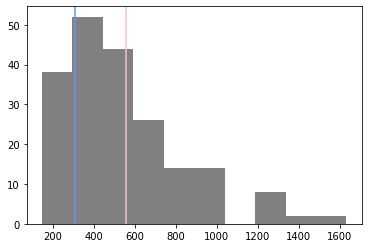

In [25]:
# plot the number in either group
list_all_groups = list_group_1 + list_group_2

plt.hist(list_all_groups, color='grey')
plt.axvline(x = 558, color = 'pink', label = 'Female')
plt.axvline(x = 310, color = 'cornflowerblue', label = 'Male')

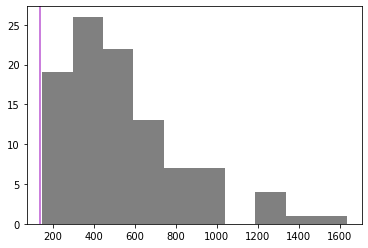

In [20]:
# plot the number in both groups

plt.hist(list_both_groups, color='grey')
plt.axvline(x = 136, color = 'mediumorchid', label = 'Both')

In [96]:
def calculate_percent_overlap(list_group_1, list_group_2, list_both_groups, percent):
    l = []
    c = 0
    fdr_count = 0
    for n_overlap in list_both_groups:
        n_group_1 = list_group_1[c]
        n_group_2 = list_group_2[c]
        percent_overlap = n_overlap/(n_group_1+n_group_2)
        if percent_overlap <= percent:
            fdr_count += 1
        l.append(percent_overlap)
        c +=1
    fdr = fdr_count/100
    print('fdr:', str(round(fdr, 4)))
    return l


def plot_percent_overlap_histogram(list_group_1, list_group_2, list_both_groups):
    l = calculate_percent_overlap(list_group_1, list_group_2, list_both_groups, 0.186)
    plt.hist(l, color='grey', range=[0,1], bins=20)
    plt.axvline(x = 0.186, color = 'mediumorchid')
    plt.show()

fdr: 0.08


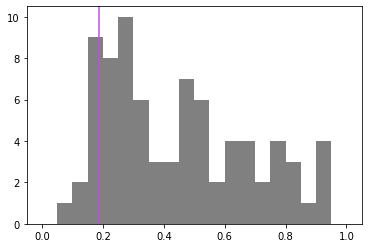

In [97]:
plot_percent_overlap_histogram(list_group_1, list_group_2, list_both_groups)

In [100]:
def calculate_percent_overlap_per_group(list_group, list_both_groups):
    l = []
    c = 0
    for n_overlap in list_both_groups:
        n_group = list_group[c]
        percent_overlap = n_overlap/(n_group)
        l.append(percent_overlap)
        c +=1
    return l


def calculate_fdr(group, l, percent):
    c = 0
    for item in l:
        if item <= percent:
            c += 1
    fdr = c/200
    print(group, 'fdr:', str(round(fdr, 4)))
    return


def plot_percent_overlap_histogram_per_group(list_group_1, list_group_2, list_both_groups):
    l_1 = calculate_percent_overlap_per_group(list_group_1, list_both_groups)
    l_2 = calculate_percent_overlap_per_group(list_group_2, list_both_groups)
    l = l_1 + l_2
    calculate_fdr('female', l, 0.244)
    calculate_fdr('male', l, 0.439)
    plt.hist(l, color='grey', range=[0,1], bins=10)
    plt.axvline(x = 0.244, color = 'pink')
    plt.axvline(x = 0.439, color = 'cornflowerblue')
    plt.show()
    return

female fdr: 0.02
male fdr: 0.14


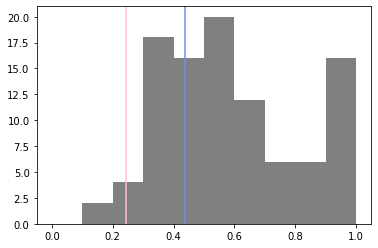

In [101]:
plot_percent_overlap_histogram_per_group(list_group_1, list_group_2, list_both_groups)

In [102]:
def calculate_percent_unique_per_group(list_group, list_both_groups):
    l = []
    c = 0
    for n_overlap in list_both_groups:
        n_group = list_group[c]
        percent_unique = (n_group-n_overlap)/(n_group)
        l.append(percent_unique)
        c +=1
    return l


def calculate_fdr(group, l, percent):
    c = 0
    for item in l:
        if item >= percent:
            c += 1
    fdr = c/200
    print(group, 'fdr:', str(round(fdr, 4)))
    return


def plot_percent_unique_per_group_histogram(list_group_1, list_group_2, list_both_groups):
    l_1 = calculate_percent_unique_per_group(list_group_1, list_both_groups)
    l_2 = calculate_percent_unique_per_group(list_group_2, list_both_groups)
    l = l_1 + l_2
    calculate_fdr('female', l, 0.756)
    calculate_fdr('male', l, 0.561)
    plt.hist(l, color='grey', range=[0,1], bins=10)
    plt.axvline(x = 0.756, color = 'pink')
    plt.axvline(x = 0.561, color = 'cornflowerblue')
    plt.show()

female fdr: 0.02
male fdr: 0.14


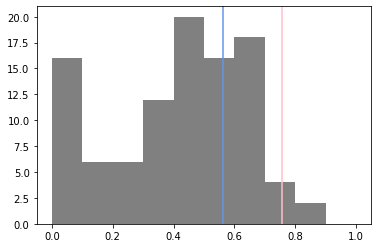

In [103]:
plot_percent_unique_per_group_histogram(list_group_1, list_group_2, list_both_groups)

In [92]:
def calculate_percent_detected(list_group_1, list_group_2, list_both_groups, percent):
    l = []
    c = 0
    fdr_count = 0
    for n_overlap in list_both_groups:
        n_group_1 = list_group_1[c]
        n_group_2 = list_group_2[c]
        percent_detected = (n_group_1+n_group_2-n_overlap)/11238
        l.append(percent_detected)
        if percent_detected <= percent:
            fdr_count += 1
        c +=1
    fdr = fdr_count/100
    print('fdr:', str(round(fdr, 4)))
    return l


def plot_percent_detected_histogram(list_group_1, list_group_2, list_both_groups):
    l = calculate_percent_detected(list_group_1, list_group_2, list_both_groups, 0.064)
    plt.hist(l, color='grey', range=[0,1])
    plt.axvline(x = 0.064, color = 'mediumorchid')
    plt.show()

fdr: 0.67


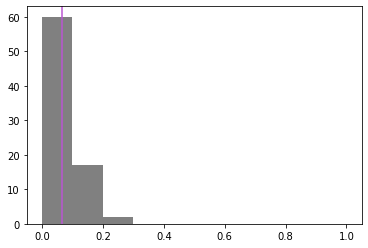

In [93]:
plot_percent_detected_histogram(list_group_1, list_group_2, list_both_groups)

In [94]:
def calculate_percent_detected(list_group):
    l = []
    c = 0
    for n in list_group:
        percent_detected = n/11238
        l.append(percent_detected)
        c +=1
    return l


def calculate_fdr(group, l, percent):
    c = 0
    for item in l:
        if item >= percent:
            c += 1
    fdr = c/200
    print(group, 'fdr:', str(round(fdr, 4)))
    return


def plot_percent_detected(list_group_1, list_group_2):
    l_1 = calculate_percent_detected(list_group_1)
    l_2 = calculate_percent_detected(list_group_2)
    l = l_1 + l_2
    calculate_fdr('female', l, 0.050)
    calculate_fdr('male', l, 0.028)
    plt.hist(l, color='grey', range=[0,1])
    plt.axvline(x = 0.050, color = 'pink')
    plt.axvline(x = 0.028, color = 'cornflowerblue')
    plt.show()

female fdr: 0.36
male fdr: 0.75


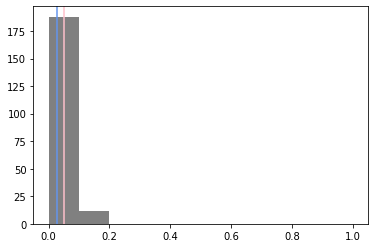

In [95]:
plot_percent_detected(list_group_1, list_group_2)